# Описание проекта

<p>Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.</p>
<p>Для начала они просят меня — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.</p>
<p>Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.</p>

# Краткий план работы

- Шаг 1. Загрузим данные и изучим общую информацию
- Шаг 2. Выполним предобработку данных
- Шаг 3. Проведем анализ данных
- Шаг 4. Детализируем исследование: открытие кофейни
- Шаг 5. Подготовим презентацию

## Шаг 1. Загрузим данные и изучим общую информацию

In [1]:
# Импортирование всех необходимых библиотек
import pandas as pd
import re
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from folium import Map, Choropleth
from folium import Map, Marker
from folium.plugins import MarkerCluster

### Загрузим данные о заведениях общественного питания Москвы.
Путь к файлу: /datasets/moscow_places.csv.

In [2]:
data = pd.read_csv('/datasets/moscow_places.csv')

### Изучим общую информацию о датасете. 
Сколько заведений представлено? Что можно сказать о каждом столбце? Значения какого типа они хранят? 

In [3]:
data.info()
display(data.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


В датасете представлено порядка 8406 заведений. Много пропущенных значений в полях price, avg_bill, middle_avg_bill, middle_coffee_cup, seats. С этими полями нужно будет аккуратно работать. На первый взгляд типы данных соответствуют ожидаемым значениям.

## Шаг 2. Выполним предобработку данных

### Изучим, есть ли дубликаты в данных.

In [4]:
data.duplicated().sum()

0

Посмотрим, есть ли неявные дубликаты.

In [5]:
data[['name', 'address']].duplicated().sum()

0

Дубликатов нет

### Поищем пропуски: встречаются ли они, в каких столбцах? Можно ли их обработать или оставить как есть?

In [6]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

- hours - оставим как есть.
- price - оставим как есть.
- avg_bill - оставим как есть.
- middle_avg_bill - этот столбец можно заполнить, исходя из того, что имеем в avg_bill.
- middle_coffee_cup - оставим как есть.
- seats - оставим как есть.

p.s. Мне казалось странным иметь пропуски в middle_avg_bill, когда в avg_bill мы уже имеем конкретные цифры. Поэтому я нашел способ сровнять количество пропусков :)

Я хочу вытащить из avg_bill числа, и вставить значения в middle_avg_bill, в случае, если в последнем пропуск.

In [7]:
def extract_avg_bill(value):
    if pd.isna(value):  # Если значение пропущено
        return None
    # Используем регулярное выражение для поиска чисел
    numbers = re.findall(r'\d+', value)
    if len(numbers) == 2:  # Если указаны диапазоны
        return (int(numbers[0]) + int(numbers[1])) / 2  # Возвращаем среднее
    elif len(numbers) == 1:  # Если указано одно число
        return int(numbers[0])
    else:
        return None  # Если чисел нет

# Заполняем пропуски в middle_avg_bill
data['middle_avg_bill'] = data['middle_avg_bill'].combine_first(
    data['avg_bill'].apply(extract_avg_bill)
)

print(data[['avg_bill', 'middle_avg_bill']].head())

                        avg_bill  middle_avg_bill
0                            NaN              NaN
1       Средний счёт:1500–1600 ₽           1550.0
2         Средний счёт:от 1000 ₽           1000.0
3  Цена чашки капучино:155–185 ₽            170.0
4         Средний счёт:400–600 ₽            500.0


Ну а так, я бы просто оставил пропуски, как есть :)

<b>Проверим, нет ли неявных дубликатов в категориях:

In [8]:
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Все в порядке!

### Создадим столбец street с названиями улиц из столбца с адресом.

Чтобы оставить только название улицы без города, номера дома и корпуса, поступим следующим образом:

In [9]:
def extract_street_name(address):
    if pd.isna(address):
        return None
    # Разделяем строку на части по запятой (чтобы убрать город и номер дома)
    parts = address.split(',')
    
    # Оставмм только название улицы (оно всегда будет вторым элементом)
    street_name = parts[1].strip() if len(parts) > 1 else ''
        
    return street_name

data['street'] = data['address'].apply(extract_street_name)

print(data[['address', 'street']].head())

                               address                   street
0           Москва, улица Дыбенко, 7/1            улица Дыбенко
1   Москва, улица Дыбенко, 36, корп. 1            улица Дыбенко
2       Москва, Клязьминская улица, 15       Клязьминская улица
3  Москва, улица Маршала Федоренко, 12  улица Маршала Федоренко
4      Москва, Правобережная улица, 1Б      Правобережная улица


### Создадим столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
- логическое значение True — если заведение работает ежедневно и круглосуточно;
- логическое значение False — в противоположном случае.

In [10]:
def is_24_7_open(hours):
    if pd.isna(hours):
        return False
    
    # Проверяем, содержит ли строка "ежедневно" и "круглосуточно"
    if 'ежедневно' in hours and ('круглосуточно' in hours or '24/7' in hours):
        return True
    return False

data['is_24_7'] = data['hours'].apply(is_24_7_open)

print(data[['hours', 'is_24_7']].tail())

                         hours  is_24_7
8401    ежедневно, 09:00–02:00    False
8402    ежедневно, 08:00–22:00    False
8403  ежедневно, круглосуточно     True
8404  ежедневно, круглосуточно     True
8405  ежедневно, круглосуточно     True


## Шаг 3. Проведем анализ данных


### Какие категории заведений представлены в данных? 
Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации. Ответим на вопрос о распределении заведений по категориям.

<b>Посмотрим на уникальные категории

In [11]:
unique_categories = data['category'].unique()
print(unique_categories)

['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']


<b>Подсчитаем количество заведений по категориям, с интерактивной визуализацией

In [12]:
# Сгруппируем данные по категории и кол-ву заведений
category_counts = data['category'].value_counts().reset_index()
category_counts.columns = ['category', 'count']

# Визуализируем
fig = px.bar(category_counts, x='category', y='count', 
             title='Распределение заведений по категориям',
             labels={'category': 'Категория', 'count': 'Количество заведений'}
             )

fig.update_xaxes(tickangle=-45) # поворачиваем подписи по оси Х на 45 градусов

fig.show()

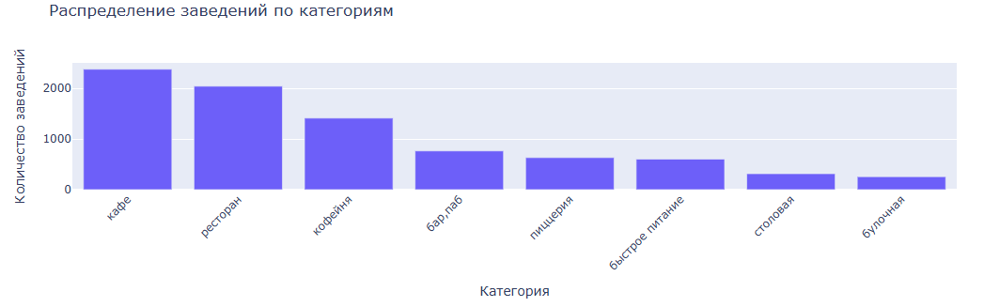

Как видно, категория с наибольшим количеством заведений - это кафе. А с наименьшим количеством - булочная.

#### Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. 
Построим визуализации. Проанализируем результаты и сделаем выводы.


In [13]:
# Сгруппируем данные по категории и кол-ву посадочных мест
category_seats = data.groupby('category')['seats'].median().sort_values(ascending=False).reset_index()
category_seats.columns = ['category', 'seats']
#print(category_seats)

# Визуализируем
fig = px.bar(category_seats, x='category', y='seats', 
             title='Среднее количество посадочных мест по категориям заведений',
             labels={'category': 'Категория', 'seats': 'Среднее количество посадочных мест'}
             )

fig.update_xaxes(tickangle=-45) # поворачиваем подписи по оси Х на 45 градусов

fig.show()

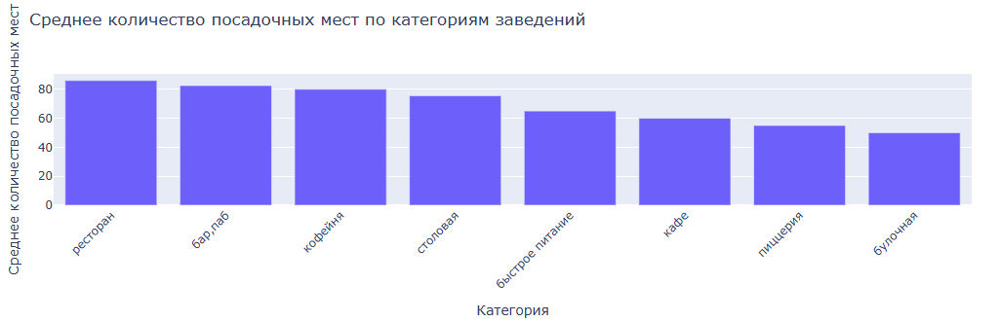

<b>Построим на данные через диаграмму размаха

In [14]:
fig = px.box(data, x='category', y='seats', 
             title='Распределение количества посадочных мест по категориям заведений',
             labels={'category': 'Категория', 'seats': 'Количество посадочных мест'},
             points='all'  # Показываем все точки (для отображения выбросов)
            )

fig.update_xaxes(tickangle=-45)  # Поворачиваем подписи по оси Х на 45 градусов
fig.update_yaxes(range=[0, 500])  # Устанавливаем лимит по оси Y

fig.show()


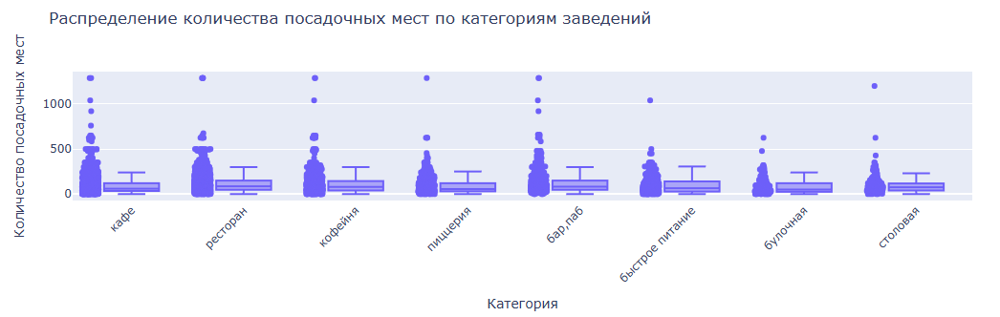

- Рестораны и бары имеют наибольшее количество посадочных мест, что логично для заведений, ориентированных на более длительное пребывание клиентов.
- Кофейни и столовые занимают промежуточное положение, предлагая достаточное количество мест для клиентов, но при этом сохраняют акцент на быстром обслуживании.
- Пиццерии, кафе и булочные имеют меньшее количество посадочных мест, что объясняется их концепцией более быстрого обслуживания и возможностью выноса.

### Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете. 
Посмотрим каких заведений больше?

In [15]:
# Сгруппируем данные по столбцу 'chain' и считаем кол-во заведений в каждой категории
chain_counts = data['chain'].value_counts().reset_index()
chain_counts.columns = ['chain', 'count']
#print(chain_counts)

# Преобразуем значения в читаемые строки
chain_counts['chain'] = chain_counts['chain'].map({0: 'Несетевое', 1: 'Сетевое'})

# Визуализируем
fig = px.bar(chain_counts, x='chain', y='count', 
             title='Соотношение сетевых и несетевых заведений',
             labels={'chain': 'Тип заведения', 'count': 'Количество заведений'},
             color='chain', color_discrete_map={'Сетевое': 'blue', 'Несетевое': 'coral'})

fig.show()

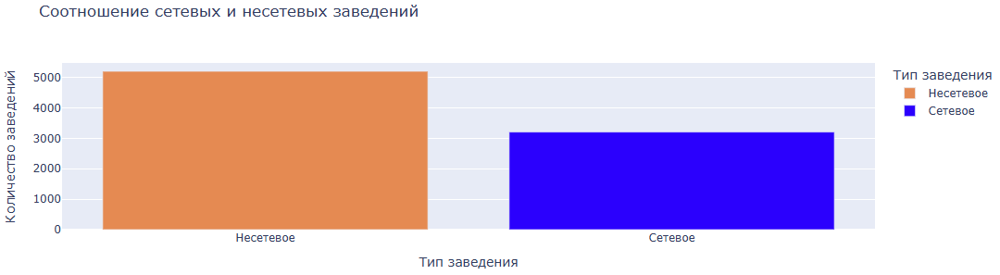

Видно, что в Москве преобладают несетевые заведения. Сетевых же почти вдвое меньше.

### Какие категории заведений чаще являются сетевыми? 
Исследуем данные и ответим на вопрос графиком.

In [16]:
# Сгруппируем данные по категории и типу сети
category_chain_counts = data.groupby(['category', 'chain']).size().reset_index(name='count')

# Преобразуем значения в читаемые строки
category_chain_counts['chain'] = category_chain_counts['chain'].map({0: 'Несетевое', 1: 'Сетевое'})

# Визуализируем
fig = px.bar(category_chain_counts, 
             x='category', 
             y='count', 
             color='chain', 
             title='Соотношение сетевых и несетевых заведений по категориям',
             labels={'count': 'Количество заведений', 'category': 'Категория заведений'},
             category_orders={'chain': ['Сетевое', 'Несетевое']})

fig.update_xaxes(tickangle=-45) # поворачиваем подписи по оси Х на 45 градусов
fig.show()


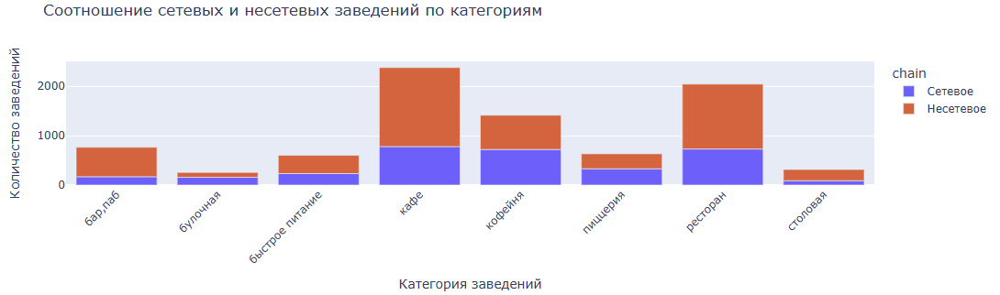

Если смотреть в процентном соотношении, то мы увидим, что кофейни чаще являются сетевыми.

### Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве. 
Под популярностью понимается количество заведений этой сети в регионе. Построим подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

In [17]:
# Фильтруем только сетевые заведения
chain_data = data[data['chain'] == 1]

# Группируем данные по названиям заведений и считаем количество объектов
top_chains = (chain_data.groupby('name')
                        .size()
                        .sort_values(ascending=False)
                        .head(15)
                        .reset_index(name='count'))

# Построение визуализации
fig = px.bar(
    top_chains,
    x='count',
    y='name',
    orientation='h',
    title='Топ-15 популярных сетей в Москве',
    labels={'count': 'Количество заведений', 'name': 'Название сети'},
    text='count',
    color='name'
)

fig.show()

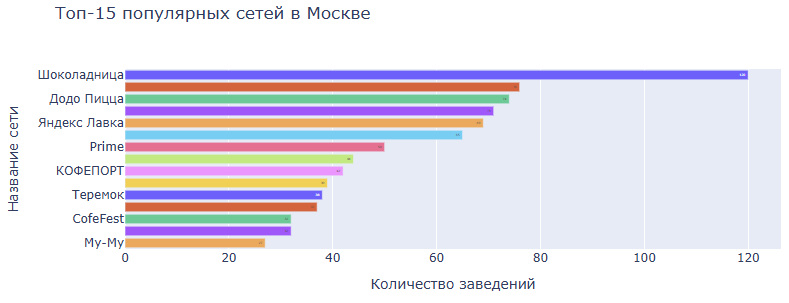

<b>Построим разбивку заведений по типам

In [18]:
# Фильтруем только сетевые заведения
chain_data = data[data['chain'] == 1]

# Группируем данные по названиям заведений и считаем количество объектов
top_chains = (chain_data.groupby('name')
                        .size()
                        .sort_values(ascending=False)
                        .head(15)
                        .reset_index(name='count'))

# Оставляем данные только для топ-15 сетей
top_chain_data = chain_data[chain_data['name'].isin(top_chains['name'])]
#print(top_chain_data)
# Группируем по сети и категории, считаем количество объектов
top_chains_categories = (top_chain_data.groupby(['name', 'category'])
                                      .size()
                                      .reset_index(name='count'))
print(top_chains_categories)

# Построение графика
fig = px.bar(
    top_chains_categories.sort_values(by='count', ascending=False),
    x='count',
    y='name',
    color='category',
    orientation='h',
    title='Распределение типов заведений в топ-15 популярных сетей',
    labels={'count': 'Количество заведений', 'name': 'Название сети', 'category': 'Категория'}
)

fig.update_xaxes(title='Количество заведений')
fig.update_yaxes(title='Сеть')
fig.show()

                                   name         category  count
0                              CofeFest             кафе      1
1                              CofeFest          кофейня     31
2                                 Cofix          кофейня     65
3                      One Price Coffee          кофейня     71
4                                 Prime             кафе      1
5                                 Prime         ресторан     49
6                               Буханка         булочная     25
7                               Буханка             кафе      1
8                               Буханка          кофейня      6
9                            Додо Пицца         пиццерия     74
10                       Домино'с Пицца         пиццерия     76
11                             КОФЕПОРТ          кофейня     42
12  Кулинарная лавка братьев Караваевых             кафе     39
13                                Му-Му          бар,паб      1
14                                Му-Му 

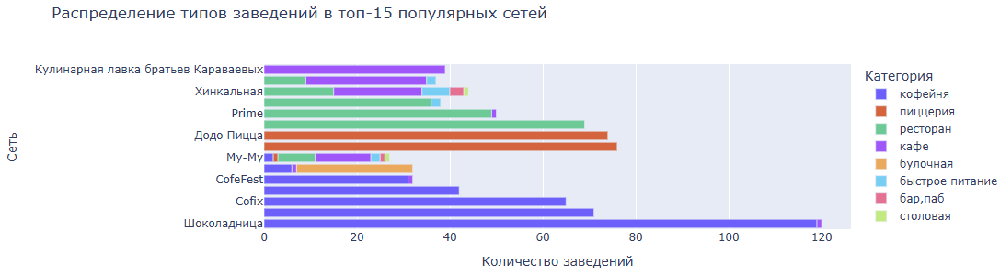

Большинство сетей относятся к кофейням. Заведения из списка популярны за счёт доступности (как ценовой, так и территориальной) и рассчитаны на широкий круг клиентов.

### Какие административные районы Москвы присутствуют в датасете? 
Отобразим общее количество заведений и количество заведений каждой категории по районам. Попробуем проиллюстрировать эту информацию одним графиком.

In [19]:
# Общее количество заведений по районам
district_counts = data.groupby('district').size().reset_index(name='total_count')

# Количество заведений каждой категории по районам
district_category_counts = data.groupby(['district', 'category']).size().reset_index(name='count')

# Поворот данных для составного графика
pivot_data = district_category_counts.pivot(index='district', columns='category', values='count').fillna(0)

# Добавление общего количества заведений
pivot_data['total'] = pivot_data.sum(axis=1)

# Сортировка по общему количеству
pivot_data = pivot_data.sort_values('total', ascending=False)

# Построение составного столбчатого графика
fig = px.bar(
    pivot_data,
    y=pivot_data.index,
    x=pivot_data.columns[:-1],  # Все категории, кроме 'total'
    title="Распределение заведений по районам и категориям",
    labels={'value': 'Количество заведений', 'district': 'Район'}
)

#fig.update_xaxes(tickangle=-45) # поворачиваем подписи по оси Х на 45 градусов
fig.show()


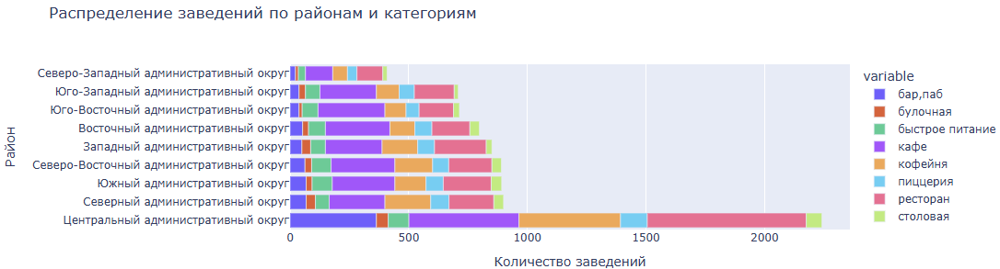

Что мы можем сказать, взглянув на график:
- Центральный административный округ является центром притяжения для общественного питания, лидируя по всем категориям.
- Рестораны и кафе лидируют по категориям в любой части Москвы. Они популярны во всех районах.
- Бары и пабы не пользуются такой же популярностью в перефирийных районах, как в центральном.

### Визуализируем распределение средних рейтингов по категориям заведений. 
Посмотрим, сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [20]:
# Группировка данных по категориям и расчет среднего рейтинга
avg_ratings = data.groupby('category')['rating'].mean().reset_index()

# Построение горизонтальной столбчатой диаграммы
fig = px.bar(
    avg_ratings,
    x='rating',
    y='category',
    orientation='h',
    title='Средние рейтинги по категориям заведений',
    labels={'rating': 'Средний рейтинг', 'category': 'Категория'},
    color='rating'
)

fig.show()

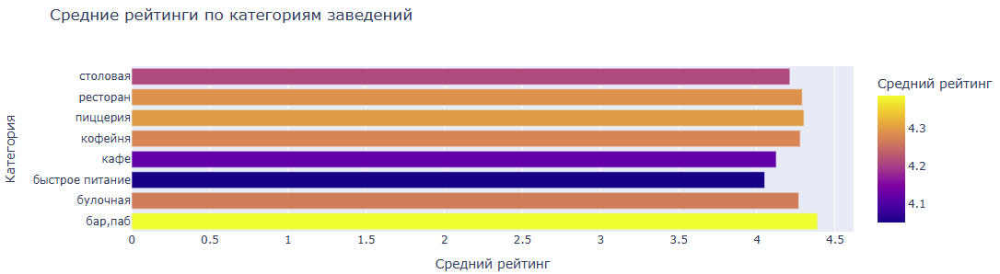

Различия в средних рейтингах между типами заведений есть, но они не критичны. Все категории имеют рейтинги выше 4.0, что говорит об общем высоком уровне заведений в Москве. Однако бары, пиццерии и рестораны выделяются более высокими оценками, тогда как быстрое питание и кафе несколько уступают.

#### Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. 
Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson.

In [21]:
# Для каждого округа посчитаем медианный рейтинг заведений, которые находятся на его территории:
rating_data = data.groupby('district', as_index=False)['rating'].agg('median')
print(rating_data)
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

                                  district  rating
0         Восточный административный округ     4.3
1          Западный административный округ     4.3
2          Северный административный округ     4.3
3  Северо-Восточный административный округ     4.2
4   Северо-Западный административный округ     4.3
5       Центральный административный округ     4.4
6     Юго-Восточный административный округ     4.2
7      Юго-Западный административный округ     4.3
8             Южный административный округ     4.3


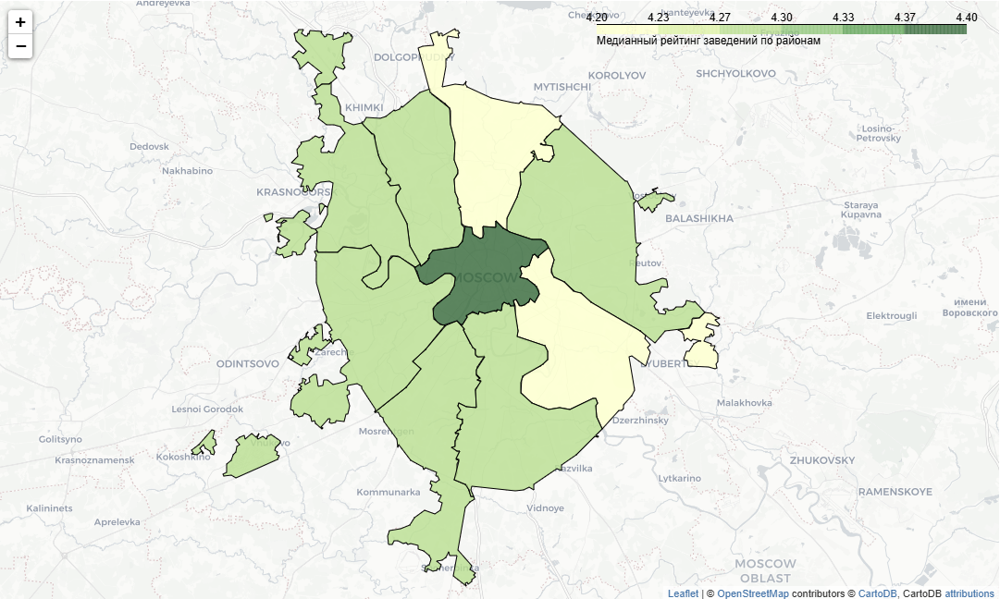

Самый высокий медианный рейтингом в ЦАО. В ЮВАО и СВАО рейтинги самые низкие. В остальных округах средние.

#### Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [22]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

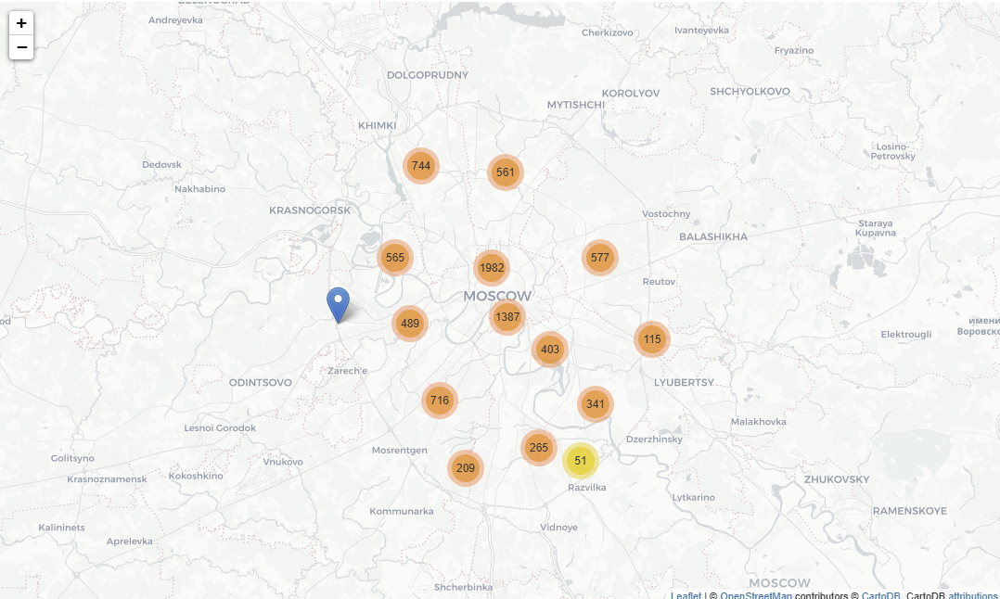

ЦАО - это туристический район города, исторический центр и Мекка для тусовщиков. Самый облагороженный, красивый и оживленный округ.

### Найдем топ-15 улиц по количеству заведений. 
Построим график распределения количества заведений и их категорий по этим улицам. Попробуем проиллюстрировать эту информацию одним графиком.

In [23]:
# Группируем по улице и считаем количество заведений на каждой
street_counts = data.groupby('street')['name'].count().reset_index(name='count')

# Сортируем по количеству заведений и выбираем топ-15
top_15_streets = street_counts.sort_values(by='count', ascending=False).head(15)
print(top_15_streets)
# Группируем по улице и категории, считая количество заведений
category_counts = data[data['street'].isin(top_15_streets['street'])].groupby(['street', 'category']).size().reset_index(name='count')

# Создаем интерактивный график с использованием Plotly
fig = px.bar(
    category_counts, 
    y='street', 
    x='count', 
    color='category', 
    title='Распределение заведений по категориям на топ-15 улицах Москвы',
    labels={'street': 'Улица', 'count': 'Количество заведений'},
    category_orders={'category': sorted(category_counts['category'].unique())},  # Сортируем категории
    height=600
)

#fig.update_xaxes(tickangle=-45) # поворачиваем подписи по оси Х на 45 градусов

fig.show()


                      street  count
1090           проспект Мира    184
773        Профсоюзная улица    122
1087    проспект Вернадского    108
525       Ленинский проспект    107
523   Ленинградский проспект     95
373        Дмитровское шоссе     88
455          Каширское шоссе     77
298         Варшавское шоссе     76
524      Ленинградское шоссе     70
550                     МКАД     65
547         Люблинская улица     60
1154          улица Вавилова     55
517     Кутузовский проспект     54
1309    улица Миклухо-Маклая     49
781          Пятницкая улица     48


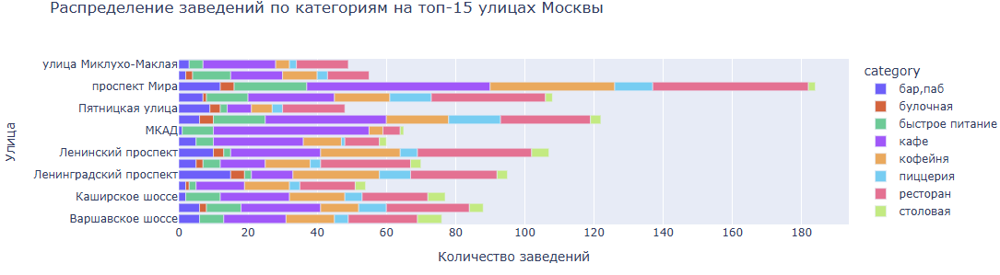

Любопытные отличия некоторых улиц по составу заведений, так например на МКАДе не так много баров-пабов, что в принципе логично. Как видно, больше всего заведений сосредоточено на протяженных улицах, проспектах и шоссе.

### Найдем улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [24]:
single_location_streets = street_counts[street_counts['count'] == 1]['street']
single_location_streets.unique()

array(['1-й Автозаводский проезд', '1-й Балтийский переулок',
       '1-й Варшавский проезд', '1-й Вешняковский проезд',
       '1-й Голутвинский переулок', '1-й Грайвороновский проезд',
       '1-й Дербеневский переулок', '1-й Земельный переулок',
       '1-й Капотнинский проезд', '1-й Кирпичный переулок',
       '1-й Колобовский переулок', '1-й Котляковский переулок',
       '1-й Курьяновский проезд', '1-й Николощеповский переулок',
       '1-й Новокузнецкий переулок', '1-й Рижский переулок',
       '1-й Самотёчный переулок', '1-й Сетуньский проезд',
       '1-й Спасоналивковский переулок', '1-й Щипковский переулок',
       '1-я Боевская улица', '1-я Курьяновская улица',
       '1-я Парковая улица', '1-я Стекольная улица',
       '1-я Фрунзенская улица', '1-я Ямская улица',
       '1-я линия Хорошёвского Серебряного Бора', '11-я Парковая улица',
       '12-я Парковая улица', '14-я Парковая улица',
       '16-я Парковая улица', '17-й проезд Марьиной Рощи',
       '2-й Балтийский переу

Как мы видим, таких улиц довольно много. Заведения, расположенные на улицах, где только один объект общепита, могут быть более заметными для прохожих и привлекать внимание благодаря своей уникальности или эксклюзивности, особенно если они расположены в небольших или тихих районах, где конкуренция минимальна. Однако, с другой стороны, они могут страдать от меньшего потока клиентов.

### Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. 
Посчитаем медиану этого столбца для каждого района. Используем это значение в качестве ценового индикатора района. Построим фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируем цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [25]:
# Рассчитываем медиану значения 'middle_avg_bill' для каждого района
median_avg_bill = data.groupby('district')['middle_avg_bill'].median().reset_index()

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаем хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Медианный средний чек по районам',
).add_to(m)

# выводим карту
m

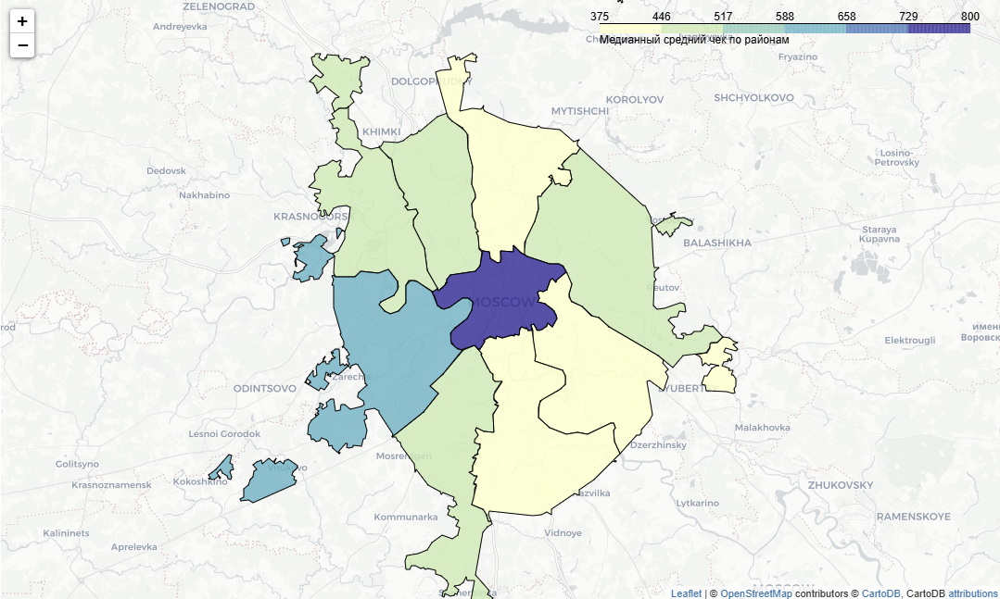

ЦАО имеет самый высокий медианный средний чек, из-за расположения в туристических и деловых зонах, где аренда и расходы выше. 
ЗАО имеет следующий по величине медианный чек, что также подтверждает высокие цены на заведения, скорее всего, из-за наличия престижных районов, таких как Раменки, Кунцево, где стоимость услуг и аренды тоже выше. В остальных же районых медианные цены на порядок ниже. Вообще можно заметить, что на востоке цены ниже, чем на западе (не считая ЦАО).

### Соберем наблюдения по вопросам выше в один общий вывод.

- На улицах с большим количеством заведений доминируют такие категории, как кафе, кофейни и пиццерии, что подтверждает популярность более демократичных заведений. В то же время более высококлассные заведения, такие как рестораны и бары, встречаются реже.
- Рейтинг заведений варьируется по категориям. Например, паб, ресторан и пиццерия показывают более высокие средние рейтинги, чем такие категории, как быстрое питание и столовая, что может свидетельствовать о более высоком уровне обслуживания и качества в таких заведениях.
- В Москве наблюдается значительное различие в ценах на еду в зависимости от района. Центральный административный округ демонстрирует самый высокий медианный средний чек (800 руб.), что связано с более дорогими заведениями в центре города. В то же время восточные округа показывают самые низкие медианные чеки (375-400 руб.), что соответствует более доступному ценовому сегменту в этих районах.
- <b>Общий тренд:</b> Центральные и западные районы города имеют более высокие цены и более престижные заведения, тогда как восточные и северные районы характеризуются более низкими ценами, что подтверждается разницей в медианных чеках. Также, на улицах с высоким количеством заведений чаще встречаются демократичные категории общепита, такие как кафе и кофейни, в то время как более дорогие заведения, как рестораны, расположены реже.

### Шаг 4. Детализируем исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуем определить, осуществима ли мечта клиентов.

- Ответьтим на следующие вопросы:
    - Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
    - Есть ли круглосуточные кофейни?
    - Какие у кофеен рейтинги? Как они распределяются по районам?
    - На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [26]:
coffee_shops = data[data['category'] == 'кофейня']
print(f"Кофеен в датасете: {len(coffee_shops)}")

Кофеен в датасете: 1413


In [27]:
# Cгруппируем кофейни по районам
coffee_shops_by_district = coffee_shops.groupby('district')['name'].count().reset_index()
coffee_shops_by_district.rename(columns={'name': 'count'}, inplace=True)
coffee_shops_by_district = coffee_shops_by_district.sort_values(by='count', ascending=False)
#print(coffee_shops_by_district)

fig = px.bar(coffee_shops_by_district, 
             y='district', 
             x='count', 
             title='Распределение кофеен по районам Москвы', 
             labels={'district': 'Район', 'count': 'Количество кофеен'},
             color='district',
             text='count')
#fig.update_xaxes(tickangle=-45) # поворачиваем подписи по оси Х на 45 градусов
fig.show()

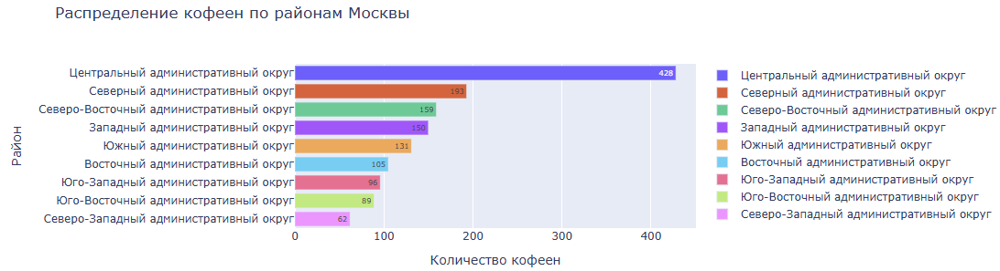

Как видно, ЦАО опережает остальные округа на порядок (428 кофеен). Оно и понятно, ведь в центре сконцентрированы основные туристические и деловые зоны. В перифирийных округах кофеен в 2 раза (как в случае с САО и тд.), а порой и в 6 раз меньше (как в случае с СЗАО).

### Есть ли круглосуточные кофейни?

In [28]:
# Считаем количество круглосуточных кофеен
coffee_shops_24_7 = coffee_shops[coffee_shops['is_24_7'] == True]

# Выводим количество круглосуточных кофеен
print(f"Количество круглосуточных кофеен: {len(coffee_shops_24_7)}")

Количество круглосуточных кофеен: 59


### Какие у кофеен рейтинги? Как они распределяются по районам?

<b>Посмотрим, на рейтинги кофеен.

count    1413.000000
mean        4.277282
std         0.372250
min         1.400000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64


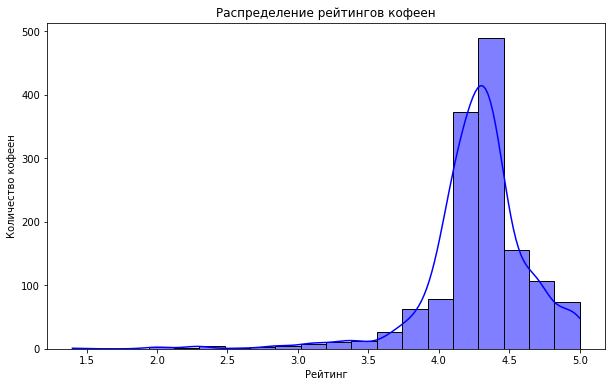

In [29]:
# Смотрим общую статистику по рейтингам
coffee_shops_ratings = coffee_shops['rating'].describe()
print(coffee_shops_ratings)

# Гистограмма рейтингов
plt.figure(figsize=(10, 6))
sns.histplot(coffee_shops['rating'], bins=20, kde=True, color='blue')
plt.title('Распределение рейтингов кофеен')
plt.xlabel('Рейтинг')
plt.ylabel('Количество кофеен')
plt.show()

Основная масса кофеен имеет высокие оценки в диапазоне 4.0 – 4.7. Мы наблюдаем нормальное распределение оценок.

<b>Посмотрим как рейтинги кофеен распределяются по районам

In [30]:
# Cгруппируем данные по районам, рассчитываем количество кофеен, средний и медианный рейтинги
district_ratings = coffee_shops.groupby('district')['rating'].agg(['count', 'mean', 'median']).reset_index()

# Сортируем по среднему рейтингу для удобства анализа
district_ratings = district_ratings.sort_values(by='mean', ascending=False)
#print(district_ratings)

fig = px.bar(
    district_ratings,
    y='district',
    x='mean',
    color='count',
    text='median',
    title='Средний и медианный рейтинг кофеен по районам',
    labels={'mean': 'Средний рейтинг', 'district': 'Район', 'count': 'Количество кофеен'}
)
fig.show()

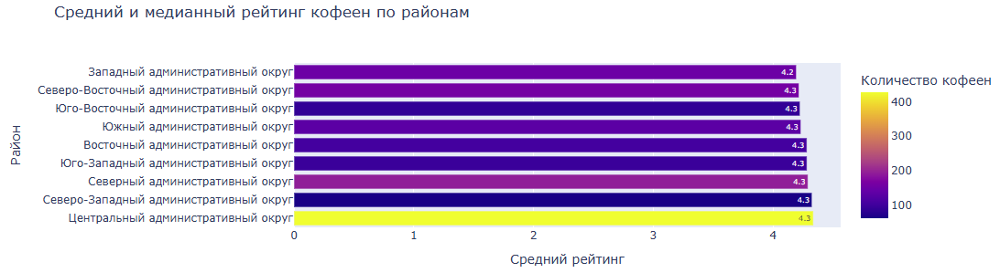

ЦАО занимает первое место с самым высоким средним рейтингом (4.34). Самый низкий средний рейтинг же в ЗАО (4.19)

### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

Для определения оптимальной стоимости чашки капучино при открытии нового заведения, нужно проанализировать столбец middle_coffee_cup, который содержит данные о средней стоимости кофе в различных районах.

- Рассчитаем медиану стоимости кофе для каждого района, чтобы исключить влияние аномально дорогих или дешёвых заведений.
- Построим распределение цен по всем районам, чтобы увидеть общую картину ценовой политики.

In [31]:
# Рассчитаем медианную стоимость кофе по районам
median_coffee_price = data.groupby('district')['middle_coffee_cup'].median().reset_index()
median_coffee_price.sort_values(by='middle_coffee_cup', ascending=False, inplace=True)
#print(median_coffee_price)

fig = px.bar(median_coffee_price, 
             y='district', 
             x='middle_coffee_cup', 
             title='Распределение стоимости чашки капучино', 
             labels={'district': 'Район', 'middle_coffee_cup': 'Средняя стоимость чашки капучино (руб)'},
             color='district',
             text='middle_coffee_cup')
#fig.update_xaxes(tickangle=-45) # поворачиваем подписи по оси Х на 45 градусов
fig.show()

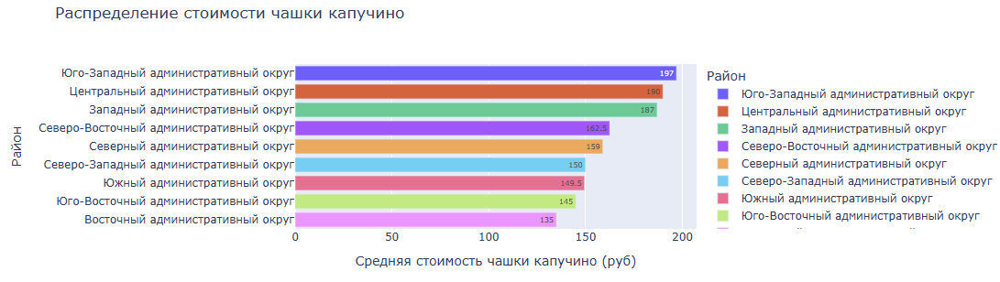

Неожиданно в ЮЗАО медианная цена за чашку кофе самая высокая, даже выше, чем в ЦАО. Следом идет ЦАО, и тройку замыкает ЗАО.

Нашим друзьям стоит ориентироваться на данный график, при открытии кофейни. Ведь цены варьируются от района к району. Так, например, если планируется открытие в округах ЦАО, ЮЗАО и ЗАО, то следует ориентироваться на среднюю стоимость 180–200 рублей за капучино. А, например, в ВАО, ЮВАО и ЮАО на среднюю стоимость 130-150.

## Презентация

Презентацию можно посмотреть здесь: <https://disk.yandex.ru/i/Vx6KfrjqaRzSRA> 

## Выводы

1. Общая картина рынка:
- В Москве функционирует большое количество заведений общественного питания, которые распределены неравномерно по административным округам. 
- ЦАО доминирует по числу заведений благодаря высокой проходимости, плотности офисов, туристическому потоку и высокой покупательной способности населения.
- На окраинах и в спальных районах заведений заметно меньше, что создаёт возможности для развития.
2. Улицы с высокой концентрацией заведений:
- Топовые улицы (например, проспект Мира, Профсоюзная улица, Ленинский проспект) выделяются количеством заведений. Это транспортные артерии с высокой проходимостью.
- Некоторые улицы, где присутствует только одно заведение, открывают возможность для монопольного покрытия аудитории.
3. Цены:
- Средние чеки сильно зависят от района. Самые высокие показатели (800 рублей) характерны для ЦАО, тогда как на окраинах средний чек составляет около 375–500 рублей.
- Для каждой категории заведения рекомендуется ориентироваться на ценовую политику, соответствующую району.
4. Рейтинги:
- Большинство заведений имеют средний рейтинг 4.2–4.4.
- Наивысшие рейтинги зафиксированы у заведений в ЦАО и СЗАО. Наименьшие же в ЗАО.
- В целом, среди округов, различия по медианным рейтингам незначительные.
5. Особенности кофеен:
- Кофейни составляют значительную долю заведений. Их средний рейтинг (4.28) соответствует общей тенденции, однако в ЦАО они показывают немного более высокие значения (4.34).
- Цены на чашку капучино варьируются от 135 рублей в ВАО до 197 рублей в ЮЗАО. Это можно учитывать при разработке стратегии ценообразования.
6. Рекоммендации:
- Открытие кафе или кофеен в спальных районах может привлечь локальную аудиторию, минимизировав конкуренцию. В центральных районах имеет смысл открывать рестораны или бары с премиальной концепцией.
- В ЦАО можно ориентироваться на высокую проходимость и платежеспособность. В спальных районах выбирать локации вблизи жилых комплексов, школ, университетов или бизнес-центров.
- Следует ориентироваться на медианный уровень среднего чека для района, где будет располагаться заведение. Вводить адаптивное меню, чтобы охватить разные категории посетителей (бюджетные опции и премиальные блюда).